In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import cv2
import preprocess_utils as pu

(1024, 1024)


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:13: RuntimeWarning: divide by zero encountered in log2


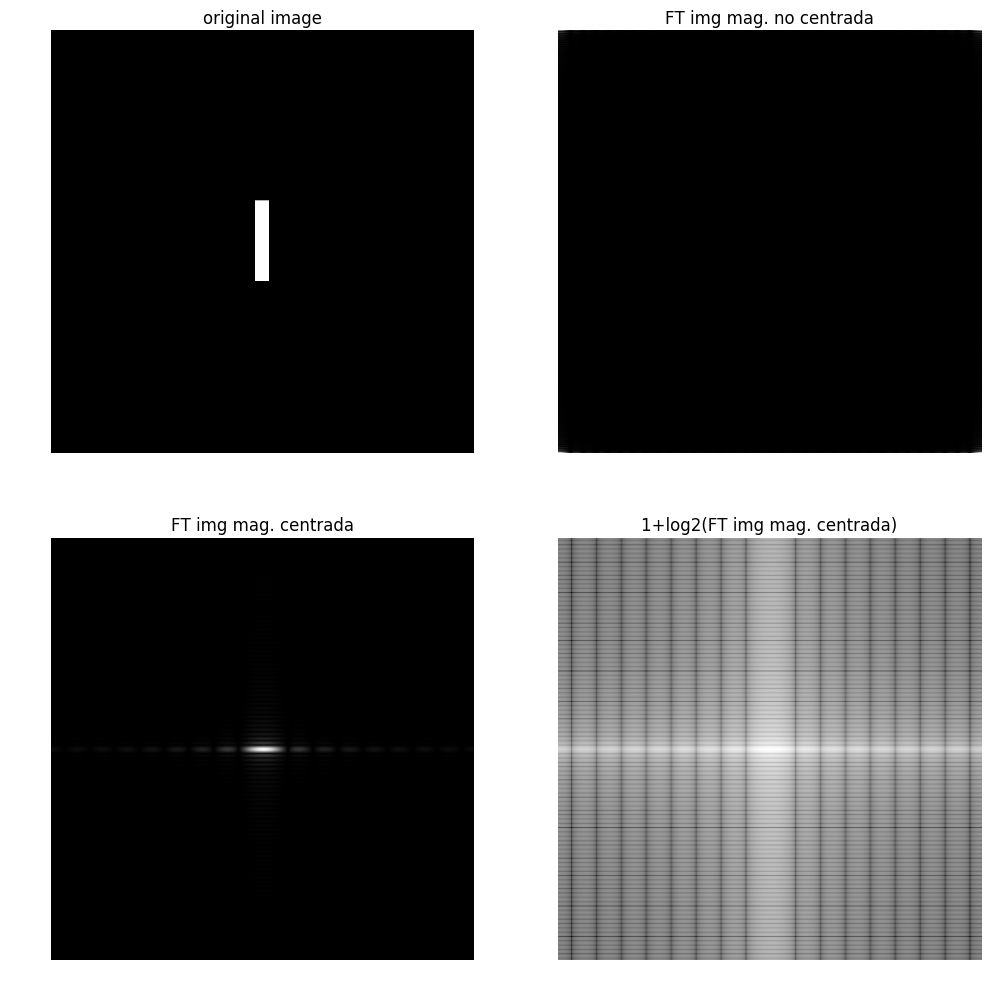

In [2]:
# fourier transform
img = cv2.imread('images/Fig0424(a)(rectangle).tif',cv2.IMREAD_GRAYSCALE)

# taking fourier transform with numpy on a int8 image
M,N = img.shape
print(M,N)
f = np.fft.fft2(np.int8(img))
fabs = np.abs(f)
fcen = np.fft.fft2(np.int8(img)*
                   (-1.0)**(np.kron(np.ones((N,1)),np.arange(1,M+1))+
                            np.kron(np.ones((M,1)),np.arange(1,N+1)).T))
fabs_cen = np.abs(fcen)
flog = 1+np.log2(fabs_cen)

plt.figure(figsize=(12,12))
plt.subplot(2,2,1),plt.imshow(img,cmap='gray',interpolation=None), plt.axis('off'), plt.title('original image')
plt.subplot(2,2,2),plt.imshow(fabs,cmap='gray',interpolation=None), plt.axis('off'), plt.title('FT img mag. no centrada')
plt.subplot(2,2,3),plt.imshow(fabs_cen[255:512+256,255:512+256],
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('FT img mag. centrada')
plt.subplot(2,2,4),plt.imshow(flog[255:512+256,255:512+256],
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('1+log2(FT img mag. centrada)')
plt.show()


preprocess_utils.py:57: RuntimeWarning: divide by zero encountered in log
  mag_spect = 20*np.log(np.abs(f_im_shift))
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


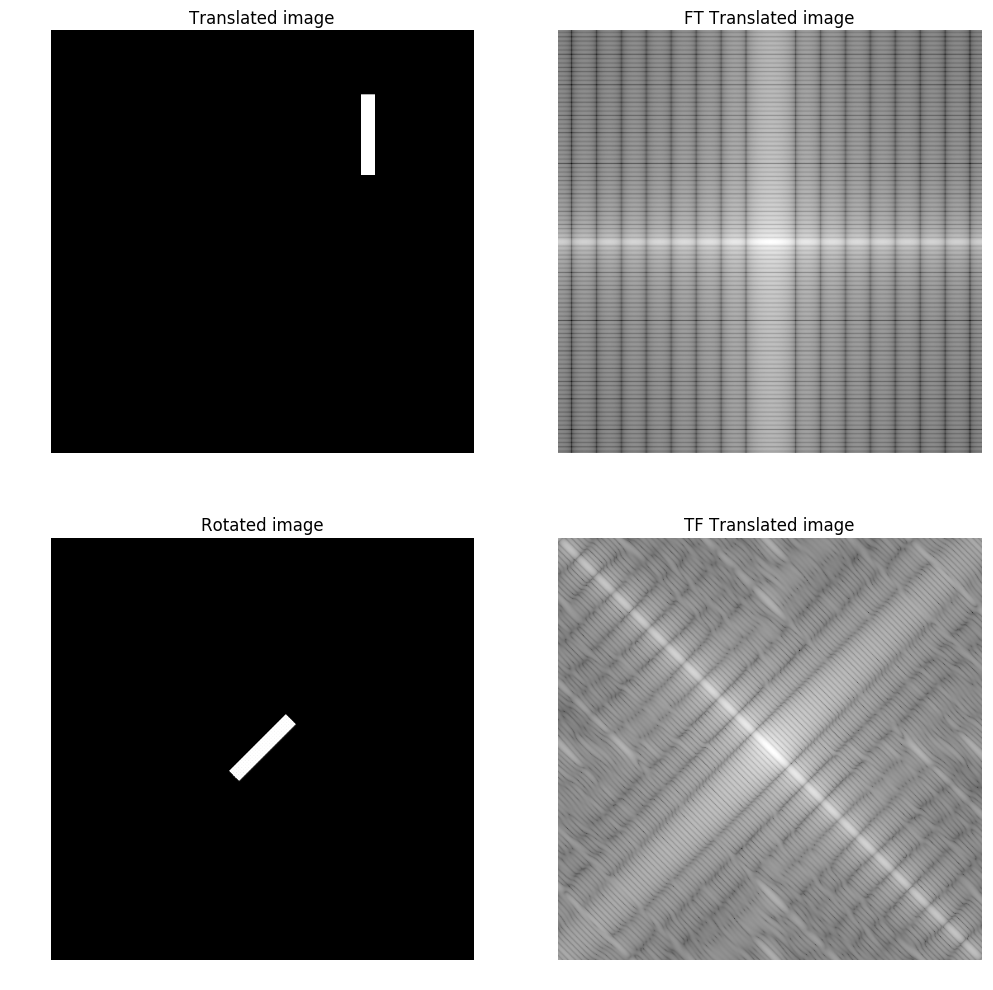

In [3]:
# translation
imgtra = np.zeros_like(img); 
imgtra[1*M/4-M/4:1*M/4+M/4,3*N/4-N/4:3*N/4+N/4] = img[M/2-M/4:M/2+M/4,N/2-N/4:N/2+N/4]
f_tra = pu.make_spectrum(imgtra)
# rotation
imgrot = np.zeros_like(img);
ang = -np.pi/4
for i in np.arange(M/2-M/4,M/2+M/4,):
    for j in np.arange(N/2-N/4,N/2+N/4):
        imgrot[(i-M/2)*np.cos(ang)-(j-N/2)*np.sin(ang)+M/2,
               (i-M/2)*np.sin(ang)+(j-N/2)*np.cos(ang)+N/2] = img[i,j]
# smooth rotation with 3x3 mean kernel only on holes
for i in np.arange(M/2-M/4,M/2+M/4,):
    for j in np.arange(N/2-N/4,N/2+N/4):
        if imgrot[i,j]==0:
            imgrot[i,j] = np.sum(imgrot[i-1:i+2,j-1:j+2])/9
imgrot[imgrot>10]==255
imgrot[imgrot<=10]==0
f_rot = pu.make_spectrum(imgrot)

plt.figure(figsize=(12,12))
plt.subplot(2,2,1),plt.imshow(imgtra,
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('Translated image')
plt.subplot(2,2,2),plt.imshow(f_tra[255:512+256,255:512+256],
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('FT Translated image')
plt.subplot(2,2,3),plt.imshow(imgrot,
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('Rotated image')
plt.subplot(2,2,4),plt.imshow(f_rot[255:512+256,255:512+256],
                              cmap='gray',interpolation=None), plt.axis('off'), plt.title('TF Translated image')
plt.show()


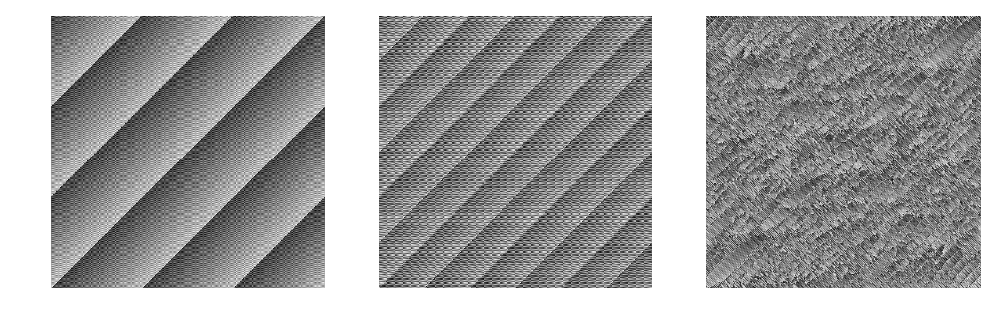

In [4]:
# phase and magnitude information
type_fcn = np.int8
f = np.fft.fft2(type_fcn(img))
fabs = np.angle(f)
ftra = np.fft.fft2(type_fcn(imgtra))
ftra = np.angle(ftra)
frot = np.fft.fft2(type_fcn(imgrot))
frot = np.angle(frot)

plt.figure(figsize=(12,12))
plt.subplot(1,3,1),plt.imshow(fabs,cmap='gray',interpolation=None), plt.axis('off')
plt.subplot(1,3,2),plt.imshow(ftra,cmap='gray',interpolation=None), plt.axis('off')
plt.subplot(1,3,3),plt.imshow(frot,cmap='gray',interpolation=None), plt.axis('off')
plt.show()


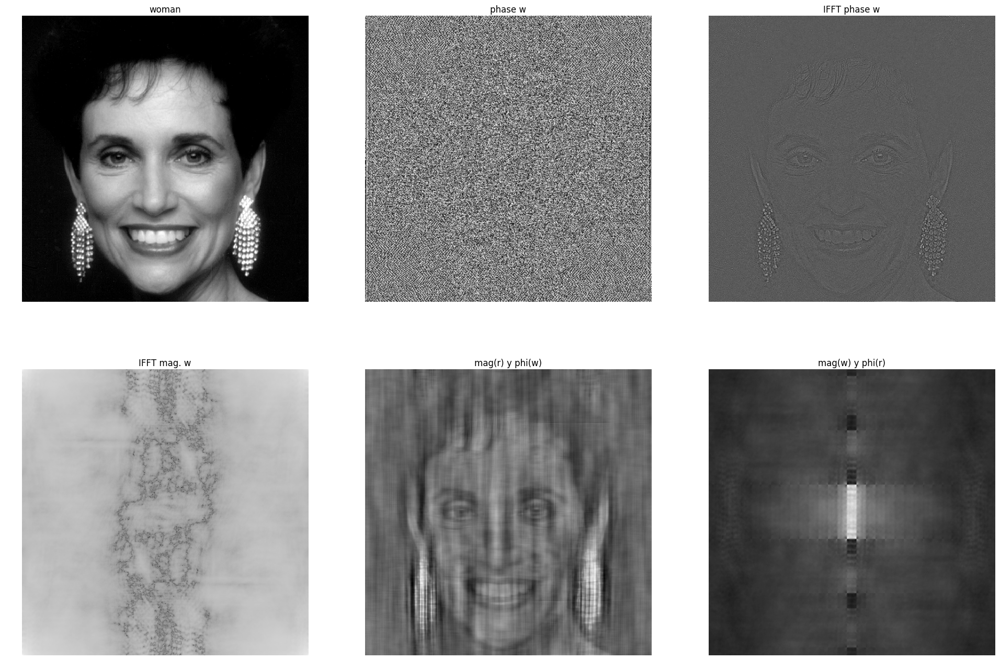

In [5]:
img_w = cv2.imread('images/Fig0427(a)(woman).tif',cv2.IMREAD_GRAYSCALE)
f_w = np.fft.fftshift(np.fft.fft2(img_w))

img_r = cv2.imread('images/Fig0424(a)(rectangle).tif',cv2.IMREAD_GRAYSCALE)
f_r = np.fft.fftshift(np.fft.fft2(cv2.resize(img_r,None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)))

# magnitude de w
f_w_mag = np.abs(f_w)
img_w_mag = np.abs( np.fft.ifft2( ( np.abs(f_w)*np.exp(1j*0.0) ) ) )
# phase or angle de w
f_w_phase = np.fft.ifftshift(np.angle(f_w))
img_w_phase = np.fft.ifft2( np.fft.ifftshift( 1.0*np.exp(1j*np.angle(f_w)) ) ).real 

img_r_w = np.fft.ifft2(np.fft.ifftshift( np.abs(f_r)*np.exp(1j*np.angle(f_w)) )).real
img_w_r = np.fft.ifft2(np.fft.ifftshift( np.abs(f_w)*np.exp(1j*np.angle(f_r)) )).real

plt.figure(figsize=(24,16))
plt.subplot(2,3,1),plt.imshow(img_w,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,3,2),plt.imshow(f_w_phase,cmap='gray',interpolation=None), plt.axis('off'), plt.title('phase w')
plt.subplot(2,3,3),plt.imshow(img_w_phase,cmap='gray',interpolation=None), plt.axis('off'), plt.title('IFFT phase w')
plt.subplot(2,3,4),plt.imshow(1+np.log(img_w_mag),cmap='gray',interpolation=None), plt.axis('off'), plt.title('IFFT mag. w')
plt.subplot(2,3,5),plt.imshow(img_r_w,cmap='gray',interpolation=None), plt.axis('off'), plt.title('mag(r) y phi(w)')
plt.subplot(2,3,6),plt.imshow(img_w_r,cmap='gray',interpolation=None), plt.axis('off'), plt.title('mag(w) y phi(r)')
plt.show()


(<matplotlib.axes._subplots.AxesSubplot at 0x7eff093872d0>,
 (-0.5, 905.5, 677.5, -0.5),
 <matplotlib.text.Text at 0x7efefaabe2d0>)

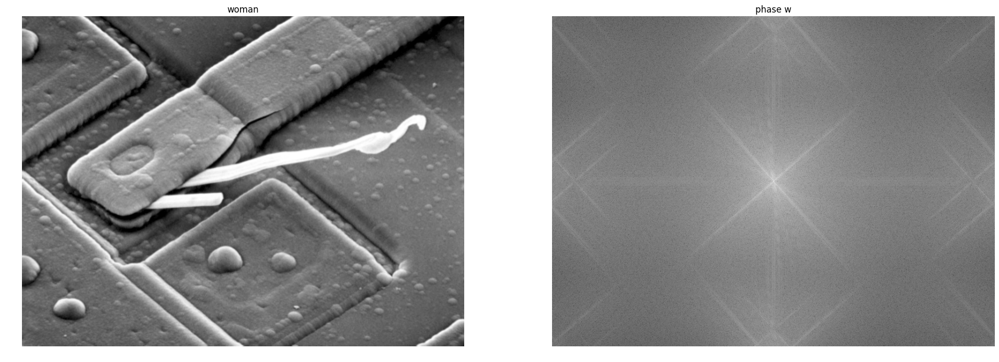

In [6]:
# FFT magnitude to highlight edges as high frecuency intensity changes
img_ic = cv2.imread('images/Fig0429(a)(blown_ic).tif',cv2.IMREAD_GRAYSCALE)
mag_f_ic = 1+np.log(np.abs(np.fft.fftshift(np.fft.fft2(img_ic))))

plt.figure(figsize=(24,12))
plt.subplot(1,2,1),plt.imshow(img_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(1,2,2),plt.imshow(mag_f_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('phase w')


(<matplotlib.axes._subplots.AxesSubplot at 0x7eff0803a110>,
 (-0.5, 905.5, 677.5, -0.5),
 <matplotlib.text.Text at 0x7eff0010af50>)

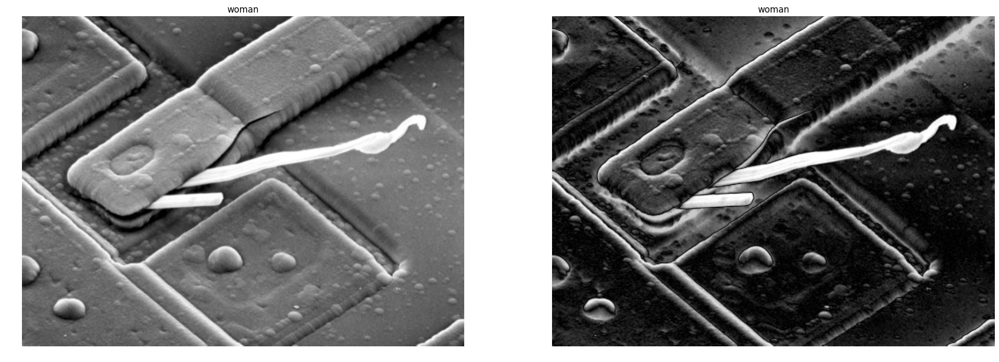

In [7]:
# Pasa altos
f_ic = np.fft.fft2(img_ic)
f_ic[0,0] = 0.0
r_img_ic = np.abs(np.fft.ifft2(f_ic))

plt.figure(figsize=(24,12))
plt.subplot(1,2,1),plt.imshow(img_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(1,2,2),plt.imshow(r_img_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')


(512, 512)


(<matplotlib.axes._subplots.AxesSubplot at 0x7eff00081f50>,
 (-0.5, 511.5, 511.5, -0.5),
 <matplotlib.text.Text at 0x7eff0807c090>)

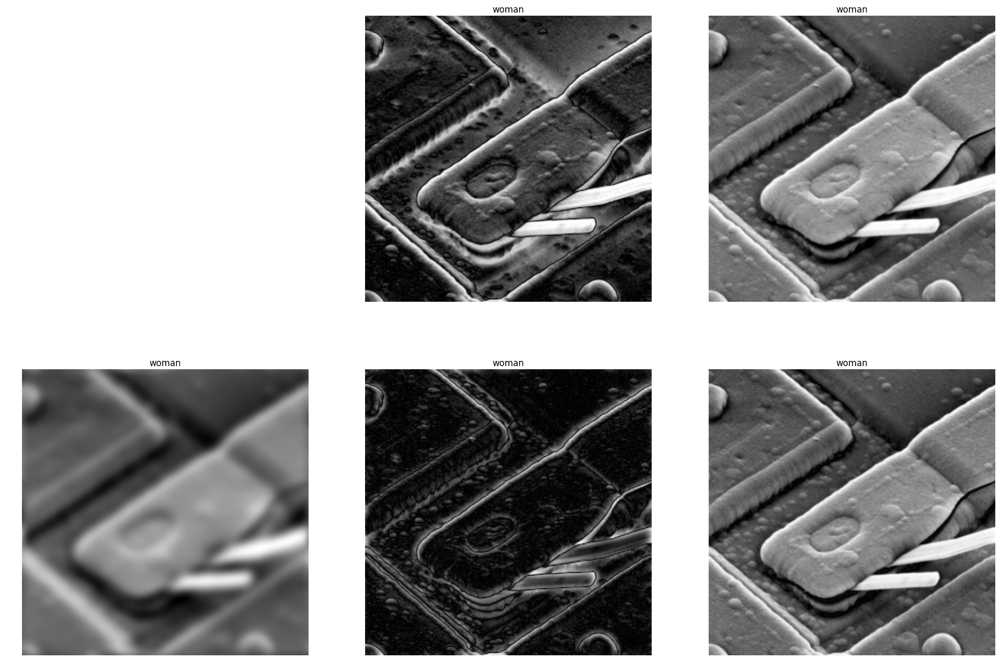

In [8]:
img_ic = cv2.imread('images/Fig0429(a)(blown_ic).tif',cv2.IMREAD_GRAYSCALE)
img_ic = img_ic[0:512,0:512]
print(img_ic.shape)

rows,cols = img_ic.shape
H_bajo = pu.get_filter_for_image(rows,cols,10,pu.filter_gaussian_fcn,params=2.0)
H_alto = 1-H_bajo
H_malto = 0.15*H_alto+0.85
img_blurred = pu.apply_frecuency_filter_to_image(img_ic, H_bajo)
img_sharped = pu.apply_frecuency_filter_to_image(img_ic, H_alto)
img_sharmto = pu.apply_frecuency_filter_to_image(img_ic, H_malto)

plt.figure(figsize=(24,16))
plt.subplot(2,3,3),plt.imshow(img_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,3,2),plt.imshow(r_img_ic[0:512,0:512],cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,3,4),plt.imshow(img_blurred,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,3,5),plt.imshow(img_sharped,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,3,6),plt.imshow(img_sharmto,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')


(<matplotlib.axes._subplots.AxesSubplot at 0x7eff08202090>,
 (-0.5, 511.5, 511.5, -0.5),
 <matplotlib.text.Text at 0x7eff093c64d0>)

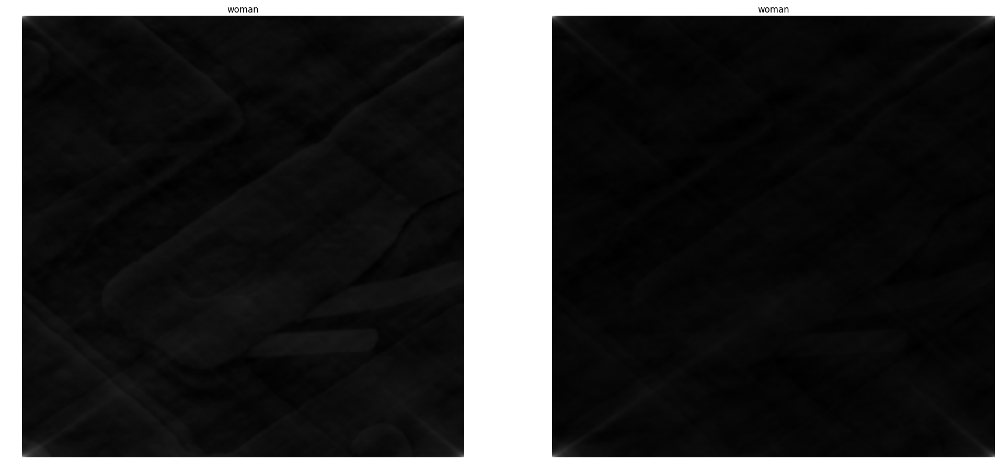

In [9]:
img_ic = cv2.imread('images/Fig0429(a)(blown_ic).tif',cv2.IMREAD_GRAYSCALE)
img_ic = img_ic[0:512,0:512]

f_ic = np.fft.fftshift(np.fft.fft2(img_ic))

img_025phi = np.fft.ifft2(np.fft.ifftshift( np.abs(f_ic)*np.exp(1j*0.25*np.angle(f_ic)) )).real
img_050phi = np.fft.ifft2(np.fft.ifftshift( np.abs(f_ic)*np.exp(1j*0.5*np.angle(f_ic)) )).real

plt.figure(figsize=(24,16))
plt.subplot(1,2,1),plt.imshow(img_050phi,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(1,2,2),plt.imshow(img_025phi,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')


(<matplotlib.axes._subplots.AxesSubplot at 0x7efefac7fbd0>,
 (-0.5, 511.5, 511.5, -0.5),
 <matplotlib.text.Text at 0x7efef93ff050>)

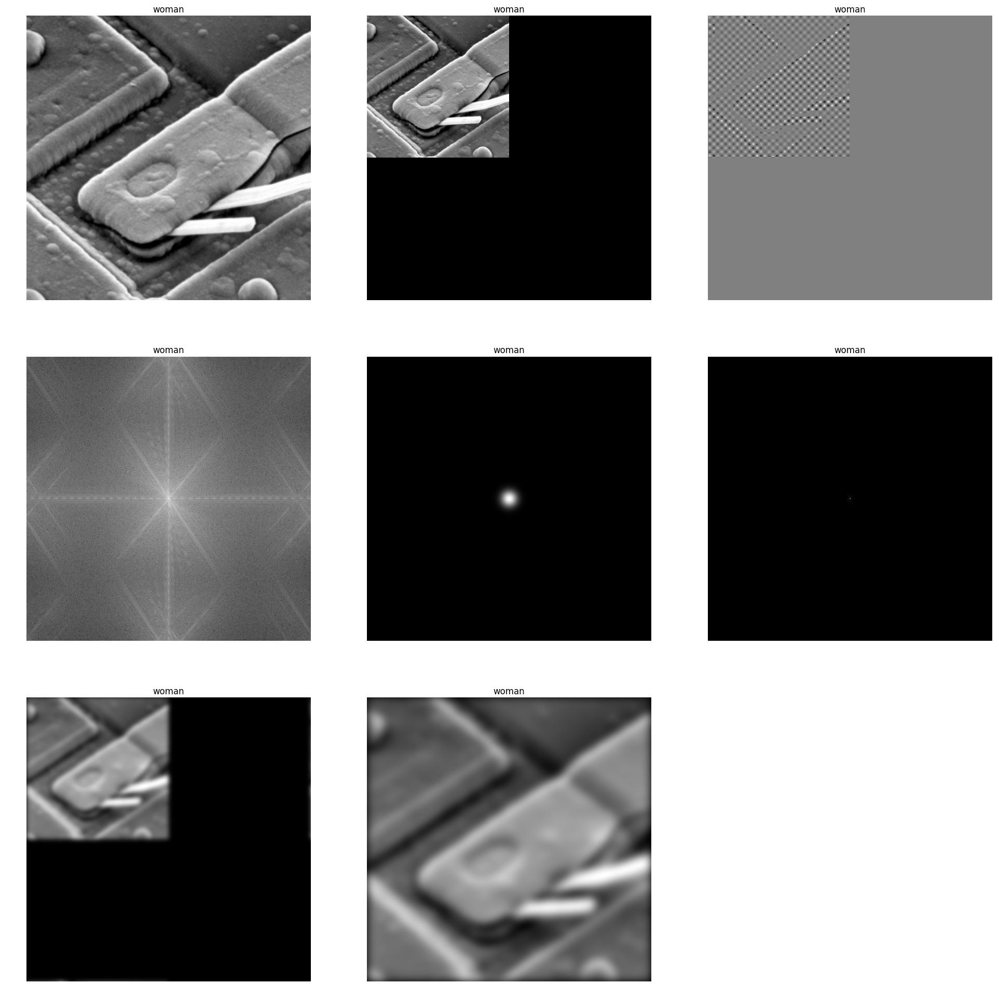

In [12]:
# steps for filtering in frecuency domain
img_ic = cv2.imread('images/Fig0429(a)(blown_ic).tif',cv2.IMREAD_GRAYSCALE)
img_ic = img_ic[0:512,0:512]

m, n = img_ic.shape
p, q = 2*m, 2*n

img_padded = np.zeros((p,q))
img_padded[0:m,0:n] = img_ic

img_p_1 = img_padded*(-1.0)**(np.kron(np.ones((p,1)),np.arange(1,q+1))+
                              np.kron(np.ones((q,1)),np.arange(1,p+1)).T)
F = np.fft.fft2(img_p_1)

H = pu.get_filter_for_image(p,q,20,pu.filter_gaussian_fcn,params=2.0)

G = H*F

g = np.fft.ifft2(G).real*(-1.0)**(np.kron(np.ones((p,1)),np.arange(1,q+1))+
                                  np.kron(np.ones((q,1)),np.arange(1,p+1)).T)

def filtering_domain(img,H):
    # 1.
    m, n = img.shape
    p, q = 2*m, 2*n
    # 2.
    img_padded = np.zeros((p,q))
    img_padded[0:m,0:n] = img
    # 3.
    img_shift = img_padded*(-1.0)**(np.kron(np.ones((p,1)),np.arange(1,q+1))+
                                    np.kron(np.ones((q,1)),np.arange(1,p+1)).T)
    # 4.
    F = np.fft.fft2(img_shift)
    # 5.
    G = H*F
    # 6.
    g = np.fft.ifft2(G).real*(-1.0)**(np.kron(np.ones((p,1)),np.arange(1,q+1))+
                                      np.kron(np.ones((q,1)),np.arange(1,p+1)).T)
    # 7.
    return g[0:m,0:n]


plt.figure(figsize=(24,24))
plt.subplot(3,3,1),plt.imshow(img_ic,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,2),plt.imshow(img_padded,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,3),plt.imshow(img_p_1,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,4),plt.imshow(1+np.log(np.abs(F)),cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,5),plt.imshow(H,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,6),plt.imshow(np.abs(G),cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,7),plt.imshow(g,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(3,3,8),plt.imshow(g[0:m,0:n],cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')


(<matplotlib.axes._subplots.AxesSubplot at 0x7efef8b86550>,
 (-0.5, 599.5, 599.5, -0.5),
 <matplotlib.text.Text at 0x7efef89efc50>)

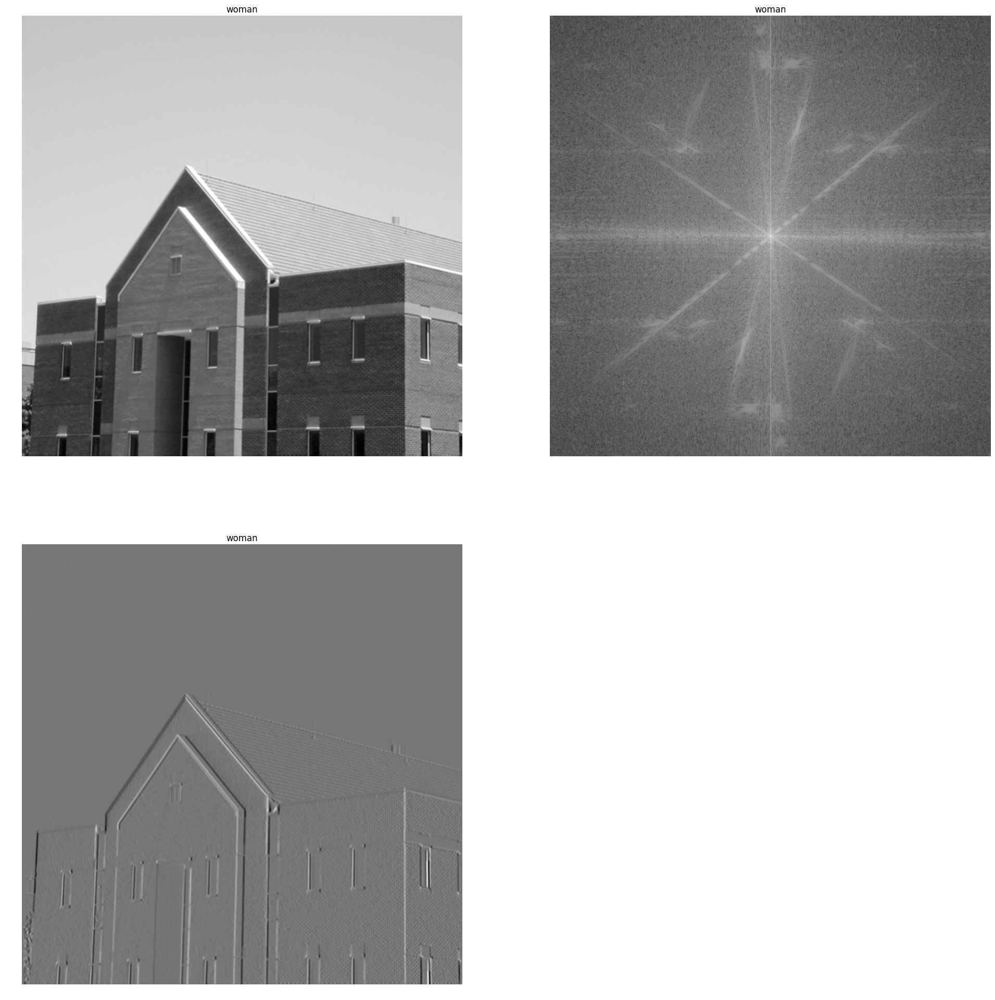

In [19]:
img_build = cv2.imread('images/Fig0438(a)(bld_600by600).tif',cv2.IMREAD_GRAYSCALE)

f_build = np.fft.fftshift(np.fft.fft2(img_build))

#img_sobel = cv2.Sobel(img_build,cv2.CV_64F,1,0,ksize=3)
kernel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
img_sobel = cv2.filter2D(np.float64(img_build),-1,kernel)

plt.figure(figsize=(24,24))
plt.subplot(2,2,1),plt.imshow(img_build,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,2,2),plt.imshow(1+np.log(np.abs(f_build)),cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
plt.subplot(2,2,3),plt.imshow(img_sobel,cmap='gray',interpolation=None), plt.axis('off'), plt.title('woman')
